In [49]:
import numpy as np
import matplotlib.pyplot as plt
import os, glob, re, json
import pandas as pd
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm, SymLogNorm, CenteredNorm
# from censai import PowerSpectrum
from censai import PhysicalModelv2
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from argparse import Namespace
import math, json
import matplotlib.pylab as pylab
import h5py
import tensorflow as tf
from matplotlib.ticker import FuncFormatter
from astropy.visualization import ImageNormalize, LogStretch
from tqdm import tqdm
from glob import glob

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 2000)
pd.set_option('display.max_colwidth', 200)

result_dir = os.path.join(os.getenv("CENSAI_PATH"), "results")
data_path = os.path.join(os.getenv("CENSAI_PATH"), "data")
models_path = os.path.join(os.getenv("CENSAI_PATH"), "models")
plt.style.use("science")
params = {'legend.fontsize': 27,
          'figure.figsize': (10, 10),
         'axes.labelsize': 27,
         'axes.titlesize': 30,#'x-large',
         'xtick.labelsize':20,
         'ytick.labelsize':20,
         'figure.titlesize': 40
         }
pylab.rcParams.update(params)
phys = PhysicalModelv2(pixels=128, image_fov=7.68, kappa_fov=7.68, method="fft")

In [50]:
def mean_std(hf_array):
    mean = np.zeros(shape=hf_array.shape[1:])
    std = np.zeros_like(mean)
    for i in range(len(hf_array)):
        mean += hf_array[i]
    mean /= len(hf_array)
    for i in range(len(hf_array)):
        std += (hf_array[i] - mean)**2
    std = np.sqrt(std/len(hf_array))
    return mean, std

# Recurrent series

100%|██████████| 8/8 [00:00<00:00, 394.07it/s]


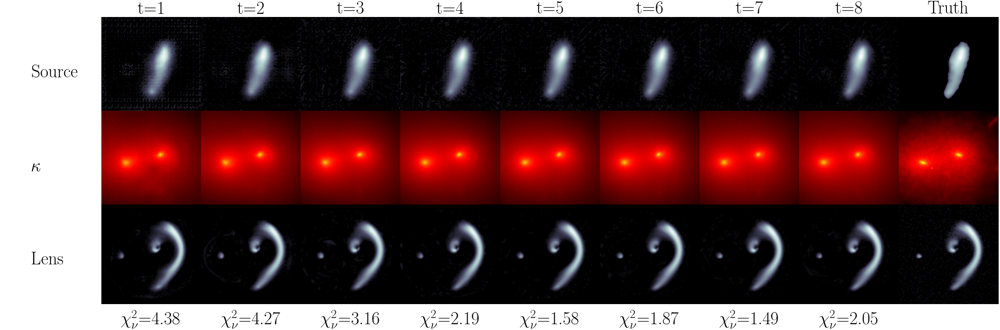

In [51]:
fig, axs = plt.subplots(3, 10, figsize=(40, 12))
hf = h5py.File("optimized_rim128hst_recurrent_series_k501.h5", "r")
lens = hf["lens"]
source = hf["source"]
kappa = hf[f"kappa"]
lens_pred = hf[f"lens_series"]
source_pred = hf[f"source_series"]
kappa_pred = hf[f"kappa_series"]
chi_squared = np.array(hf["chi_squared_series"]).squeeze()
noise_rms = hf["noise_rms"]
psf = hf["psf"]
cmap = "bone"
cmap_k = "hot"

axs[0, 0].annotate("Source", xy=(0.3, 0.4), xycoords="axes fraction", fontsize=40)
axs[0, 0].axis("off")
axs[1, 0].annotate(r"$\kappa$", xy=(0.3, 0.4), xycoords="axes fraction", fontsize=40)
axs[1, 0].axis("off")
axs[2, 0].annotate("Lens", xy=(0.3, 0.4), xycoords="axes fraction", fontsize=40)
axs[2, 0].axis("off")
for i in tqdm(range(1, 9)):
    axs[0, i].imshow(source_pred[i-1], cmap=cmap, norm=ImageNormalize(stretch=LogStretch(a=100), vmin=1e-3, vmax=1), origin="lower")
    axs[0, i].axis("off")
    axs[0, i].set_title(f"t={i}", fontsize=40)
    axs[1, i].imshow(10**kappa_pred[i-1], cmap=cmap_k, norm=LogNorm(vmin=1e-1, vmax=100), origin="lower")
    axs[1, i].axis("off")
    axs[2, i].annotate(fr"$\chi^2_\nu$={2*chi_squared[i-1]:.2f}", (0.2, -0.2), xycoords="axes fraction", fontsize=40)
    axs[2, i].imshow(lens_pred[i-1], cmap=cmap, norm=ImageNormalize(stretch=LogStretch(a=100), vmin=1e-3, vmax=1), origin="lower")
    axs[2, i].axis("off")
    
# fig.suptitle("Validation set")
axs[0, -1].imshow(source, cmap=cmap, norm=ImageNormalize(stretch=LogStretch(), vmin=3e-2, vmax=1), origin="lower")
axs[0, -1].axis("off")
axs[0, -1].set_title(f"Truth", fontsize=40)
axs[1, -1].imshow(kappa, cmap=cmap_k, norm=LogNorm(vmin=1e-1, vmax=100), origin="lower")
axs[1, -1].axis("off")
axs[2, -1].imshow(lens, cmap=cmap, norm=ImageNormalize(stretch=LogStretch(a=100), vmin=1e-3, vmax=1), origin="lower")
axs[2, -1].axis("off")
plt.subplots_adjust(wspace=0, hspace=-0.1)
plt.savefig(f"RIMSU128hstv4_optim_example.png")

# Print individual panes and grad

In [144]:
# plt.imshow(10**kappa_pred[1], cmap=cmap_k, norm=LogNorm(vmin=1e-1, vmax=100), origin="lower")
# plt.axis("off")
# plt.savefig("kappa_t2.png")

In [145]:
# plt.imshow(lens_pred[1], cmap=cmap, norm=ImageNormalize(stretch=LogStretch(a=100), vmin=1e-3, vmax=1), origin="lower")
# plt.axis("off")
# plt.savefig("lens_t2.png")

In [146]:
# plt.imshow(lens, cmap=cmap, norm=ImageNormalize(stretch=LogStretch(a=100), vmin=1e-3, vmax=1), origin="lower")
# plt.axis("off")
# plt.savefig("lens.png")

In [147]:
# plt.imshow(source_pred[0], cmap=cmap, norm=ImageNormalize(stretch=LogStretch(a=100), vmin=1e-3, vmax=1), origin="lower")
# plt.axis("off")
# plt.savefig("source_t1.png")

In [45]:
# source_o = tf.constant(np.array(source_pred[0])[None, ..., None], dtype=tf.float32)
# kappa_o = tf.constant(np.array(kappa_pred[0])[None, ..., None], dtype=tf.float32)
# lens = tf.constant(np.array(hf["lens"])[None, ..., None], dtype=tf.float32)
# psf = tf.constant(np.array(hf["psf"])[None, ..., None], dtype=tf.float32)
# noise_rms = np.array(hf["noise_rms"])
# with tf.GradientTape() as tape:
#     tape.watch(source_o)
#     tape.watch(kappa_o)
#     y = phys.forward(source_o, kappa_o, psf)
#     likelihood = 0.5 * tf.reduce_sum((y - lens)**2/noise_rms**2)
# s_grad, k_grad = tape.gradient(likelihood, [source_o, kappa_o])
# sg = (s_grad / (np.sqrt(s_grad**2) + 1e-8)).numpy()[0, ..., 0]
# kg = (k_grad / (np.sqrt(k_grad**2) + 1e-8)).numpy()[0, ..., 0]

In [44]:
# plt.imshow(sg, cmap="seismic", origin="lower")
# plt.axis("off")
# plt.savefig("source_grad0.png")

In [43]:
# plt.imshow(kg, cmap="seismic", origin="lower")
# plt.axis("off")
# plt.savefig("kappa_grad0.png")

In [46]:
# beta1 = 0.9
# beta2 = 0.99
# source_o = tf.constant(np.array(source_pred[1])[None, ..., None], dtype=tf.float32)
# kappa_o = tf.constant(np.array(kappa_pred[1])[None, ..., None], dtype=tf.float32)
# lens = tf.constant(np.array(hf["lens"])[None, ..., None], dtype=tf.float32)
# psf = tf.constant(np.array(hf["psf"])[None, ..., None], dtype=tf.float32)
# noise_rms = np.array(hf["noise_rms"])
# with tf.GradientTape() as tape:
#     tape.watch(source_o)
#     tape.watch(kappa_o)
#     y = phys.forward(source_o, kappa_o, psf)
#     likelihood = 0.5 * tf.reduce_sum((y - lens)**2/noise_rms**2)
# s_grad2, k_grad2 = tape.gradient(likelihood, [source_o, kappa_o])
# grad_mean1 = beta1 * s_grad + (1 - beta1) * s_grad2
# grad_var1 = beta2 * (1 - beta2) * s_grad**2 + (1 - beta2) * tf.square(s_grad2)
# grad_mean2 = beta1 * k_grad + (1 - beta1) * k_grad2
# grad_var2 = beta2 * (1 - beta2) * k_grad**2 + (1 - beta2) * tf.square(k_grad2)
# m_hat1 = grad_mean1 / (1 - beta1 ** 2)
# v_hat1 = grad_var1 / (1 - beta2 ** 2)
# m_hat2 = grad_mean2 / (1 - beta1 ** 2)
# v_hat2 = grad_var2 / (1 - beta2 ** 2)
# sg = (m_hat1 / (tf.sqrt(v_hat1) + 1e-8)).numpy()[0, ..., 0]
# kg = (m_hat2 / (tf.sqrt(v_hat2) + 1e-8)).numpy()[0, ..., 0]

In [47]:
# plt.imshow(sg, cmap="seismic", origin="lower")
# plt.axis("off")
# plt.savefig("source_grad1.png")

In [48]:
# plt.imshow(kg, cmap="seismic", origin="lower")
# plt.axis("off")
# plt.savefig("kappa_grad1.png")

# RMSprop sampling

In [52]:
hf = h5py.File("rmsprop_sampling_rim128hst_211222.h5", "r")

In [53]:
hf.keys()

<KeysViewHDF5 ['chi_squared_series', 'kappa', 'kappa_mse_series', 'kappa_series', 'lens', 'lens_series', 'source', 'source_mse_series', 'source_series']>

In [82]:
chisq = 2*np.array(hf["chi_squared_series"])
N = len(hf["source_series"])

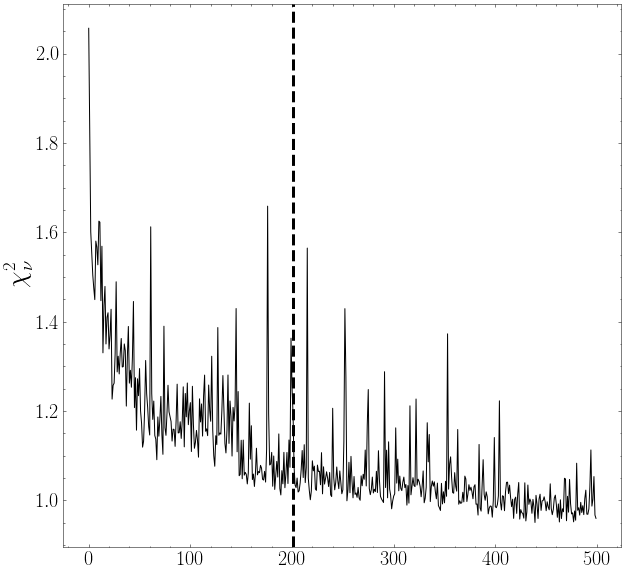

In [83]:
plt.plot(chisq, color="k")
plt.ylabel(r"$\chi^2_\nu$")
plt.axvline(len(chisq) - N, color="k", ls="--", lw=3) # burn-in
# plt.yscale("log")

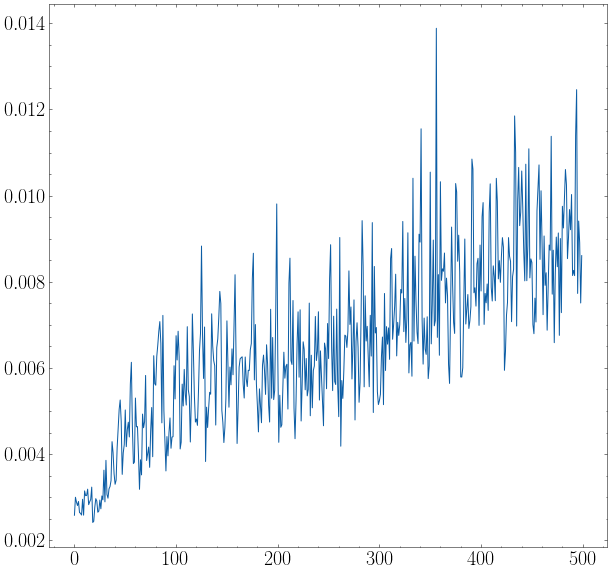

In [55]:
plt.plot(np.array((hf["kappa_mse_series"])))

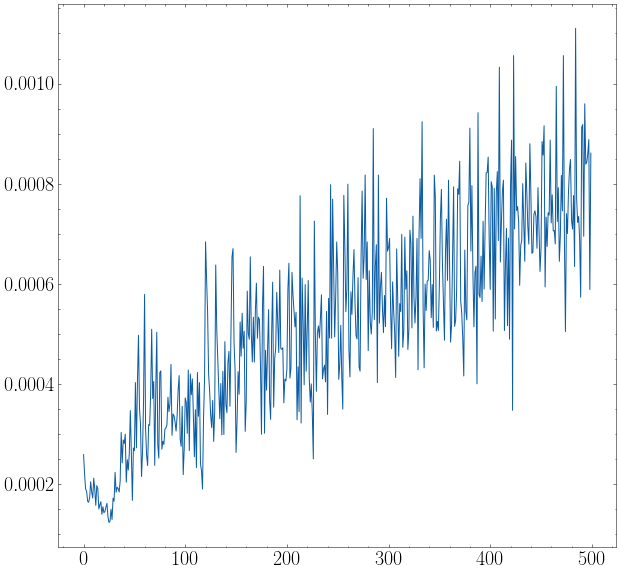

In [56]:
plt.plot(np.array((hf["source_mse_series"])))

In [84]:
source_mean, source_std = mean_std(hf["source_series"])
kappa_mean, kappa_std = mean_std(hf["kappa_series"])

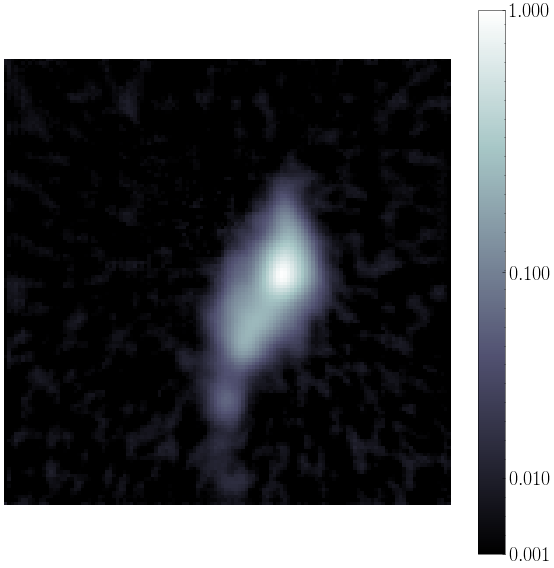

In [89]:
plt.imshow(source_mean,  cmap="bone", norm=ImageNormalize(stretch=LogStretch(a=100), vmin=1e-3, vmax=1), origin="lower")
plt.colorbar(ticks=[1e-3, 1e-2, 1e-1, 1])
plt.axis("off");

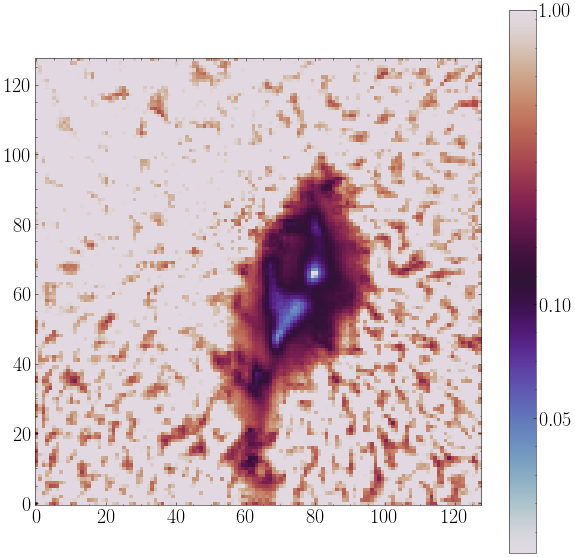

In [86]:
plt.imshow(np.sqrt((source_std**2/source_mean**2)), cmap="twilight", norm=ImageNormalize(stretch=LogStretch(a=100), vmax=1), origin="lower")
plt.colorbar(ticks=[0.02, 0.05, 1e-1, 1])

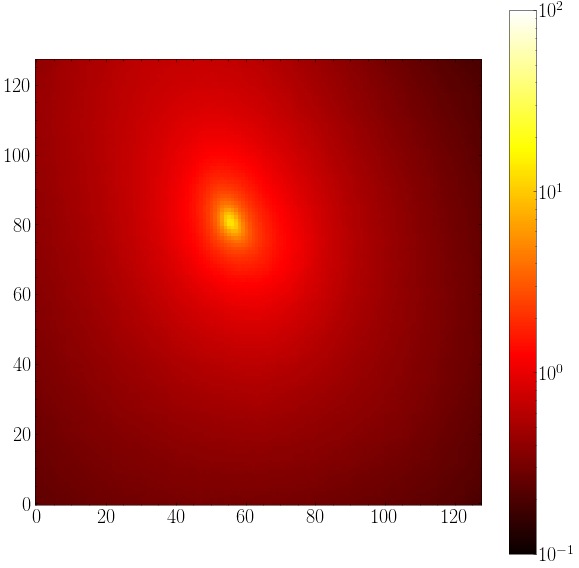

In [87]:
plt.imshow(kappa_mean, cmap="hot", norm=LogNorm(vmin=1e-1, vmax=100), origin="lower")
plt.colorbar()

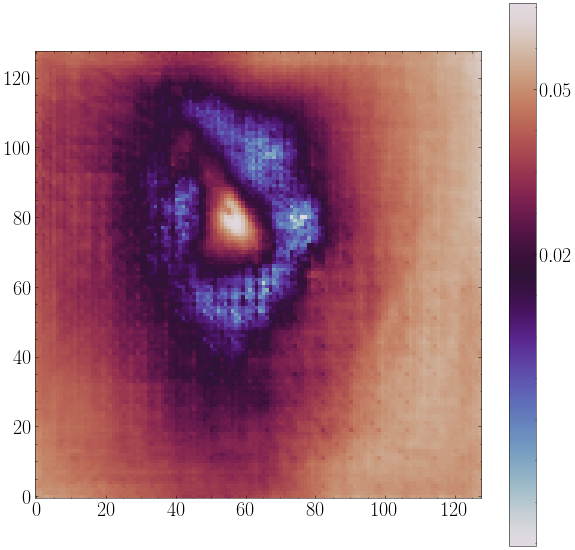

In [90]:
plt.imshow(np.sqrt((kappa_std**2/kappa_mean**2)), cmap="twilight", norm=ImageNormalize(stretch=LogStretch(a=100)), origin="lower")
plt.colorbar(ticks=[0.02, 0.05, 1e-1, 1])

# Testset

In [56]:
path = os.getenv('CENSAI_PATH') + "results/" 
hf = []
for file in glob(path + "RIMSU128hstv4_augmented_003_K3_L5_BCL2_211124140837_continue_lr6e-05_211129202839_RIMSource128hstv3_control_009_A1_L3_FLM0.0_211108220845_*.h5"):
    try:
        hf.append(h5py.File(file, "r"))
    except:
        continue
# hf = h5py.File(path + "RIMSU128hstv4_augmented_003_K3_L5_BCL2_211124140837_continue_lr6e-05_211129202839_RIMSource128hstv3_control_009_A1_L3_FLM0.0_211108220845_01.h5", 'r')
B = 50 # example per files|

In [11]:
dataset = "lenses128hst_TNG_rau_200k_control_denoised_testset_validated"
hf[0][dataset].keys()

<KeysViewHDF5 ['chi_squared', 'chi_squared2', 'chi_squared_reoptimized', 'kappa', 'kappa_coherence_spectrum', 'kappa_coherence_spectrum_reoptimized', 'kappa_fov', 'kappa_frequencies', 'kappa_optim_mse', 'kappa_pred', 'kappa_pred_reoptimized', 'lens', 'lens_coherence_spectrum', 'lens_coherence_spectrum2', 'lens_coherence_spectrum_repotimized', 'lens_fov', 'lens_frequencies', 'lens_pred', 'lens_pred2', 'lens_pred_reoptimized', 'noise_rms', 'psf', 'psf_fwhm', 'source', 'source_coherence_spectrum', 'source_coherence_spectrum2', 'source_coherence_spectrum_reoptimized', 'source_fov', 'source_frequencies', 'source_optim_mse', 'source_pred', 'source_pred2', 'source_pred_reoptimized']>

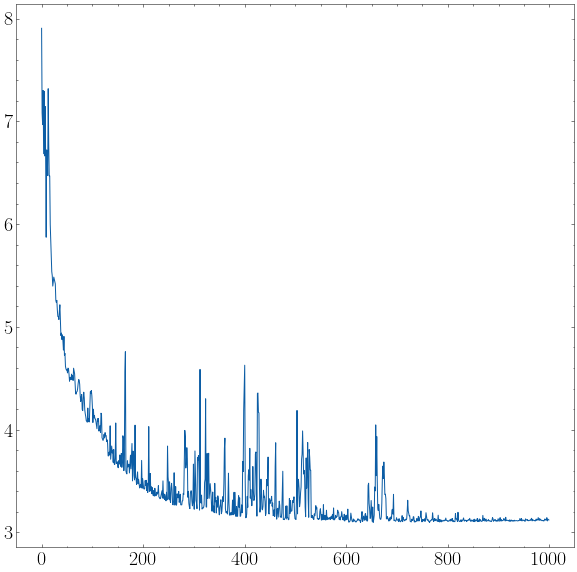

In [292]:
# for i in range(50):
#     plt.plot(hf[3][dataset]["chi_squared_reoptimized"][i, :])
plt.plot(hf[1922//B][dataset]["chi_squared_reoptimized"][1922%50])
# plt.plot(hf[1922//B][dataset]["source_optim_mse"][1922%50])

# plt.yscale("log")

In [297]:
source_mse_prior = []
kappa_mse_prior = []
source_mse_reopt = []
kappa_mse_reopt = []
for i in range(len(hf)):
    for j in range(50):
        source_pred = hf[i][dataset]["source_pred"][j][-1]
        source = hf[i][dataset]["source"][j]
        source_mse_prior.append(((source_pred - source)**2).mean())
        kappa_pred = hf[i][dataset]["kappa_pred"][j][-1]
        kappa = hf[i][dataset]["kappa"][j]
        kappa_mse_prior.append(((kappa - kappa_pred)**2).mean())
        source_reopt = hf[i][dataset]["source_pred_reoptimized"][j]
        source_mse_reopt.append(((source_reopt - source)**2).mean())
        kappa_reopt = hf[i][dataset]["kappa_pred_reoptimized"][j]
        kappa_mse_reopt.append(((kappa - kappa_pred)**2).mean())


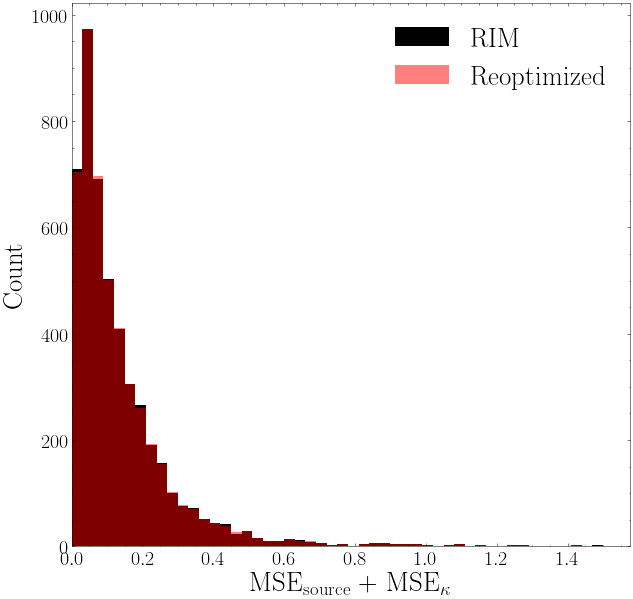

In [307]:
plt.hist([s + k for s, k in zip(source_mse_prior, kappa_mse_prior)], bins=50, color="k", label="RIM", range=(0, 1.5))
plt.hist([s + k for s, k in zip(source_mse_reopt, kappa_mse_reopt)], bins=50, color="r", label="Reoptimized", alpha=0.5, range=(0, 1.5))
plt.legend()
plt.xlim(0)
plt.ylabel("Count")
plt.xlabel("MSE$_{\mathrm{source}}$ + MSE$_{\kappa}$");
plt.savefig("prior_reopt.png")

# Test set

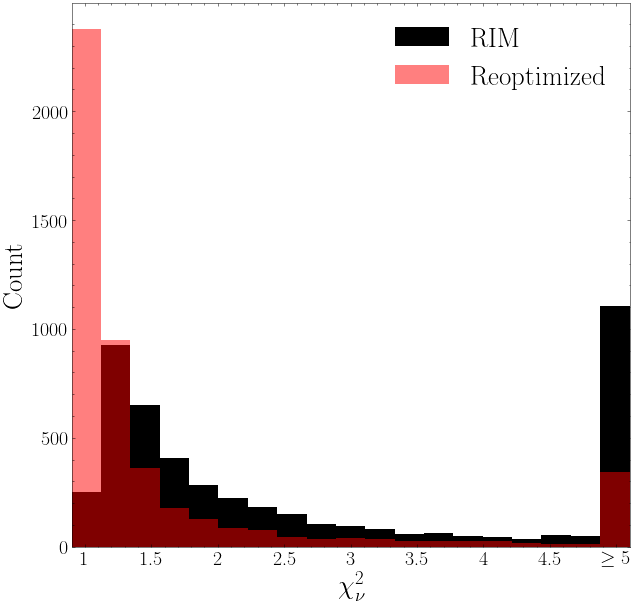

In [257]:
chisq = []
chisq_ro = []
noise_rms_list = []
for i in range(len(hf)):
    chisq.append(hf[i][dataset]["chi_squared"][:, -1])
    noise_rms_list.append(hf[i][dataset]["noise_rms"])
    _chisq_ro = hf[i][dataset]["chi_squared_reoptimized"]
    for j in range(50):
        __chisq_ro = _chisq_ro[j] # this is the actual value of the reoptimized chi squared. We should make an entry for it because this is confusing
        __chisq_ro = __chisq_ro[__chisq_ro > 0].min()
        chisq_ro.append(__chisq_ro)
chisq = np.concatenate(chisq)
noise_rms_list = np.concatenate(noise_rms_list)
chisq_ro = np.array(chisq_ro)
    
# noise_rms = np.array(hf[dataset]["noise_rms"])
bins = np.linspace(0.9, 5.1, 20)
# bins = np.concatenate([bins, [1000]])
plt.hist(np.minimum(chisq, 5.1), bins=bins, histtype="stepfilled", color="k", label="RIM");
plt.hist(np.minimum(chisq_ro, 5.1), bins=bins, histtype="stepfilled", color="r", alpha=0.5, label="Reoptimized");

# plt.hist(chi_squared[:, -1], bins=bins, histtype="step", color="k");
x = [1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5]
labels = ["1", "1.5", "2", "2.5", "3", "3.5", "4", "4.5", r"$\geq 5$"]
plt.xticks(x, labels)
# plt.title("Quality of Fit Distribution")
plt.xlim(0.9, 5.1)
plt.ylabel("Count")
plt.xlabel(r"$\chi^2_\nu$")
plt.legend()
plt.savefig("chi_squared_distribution")


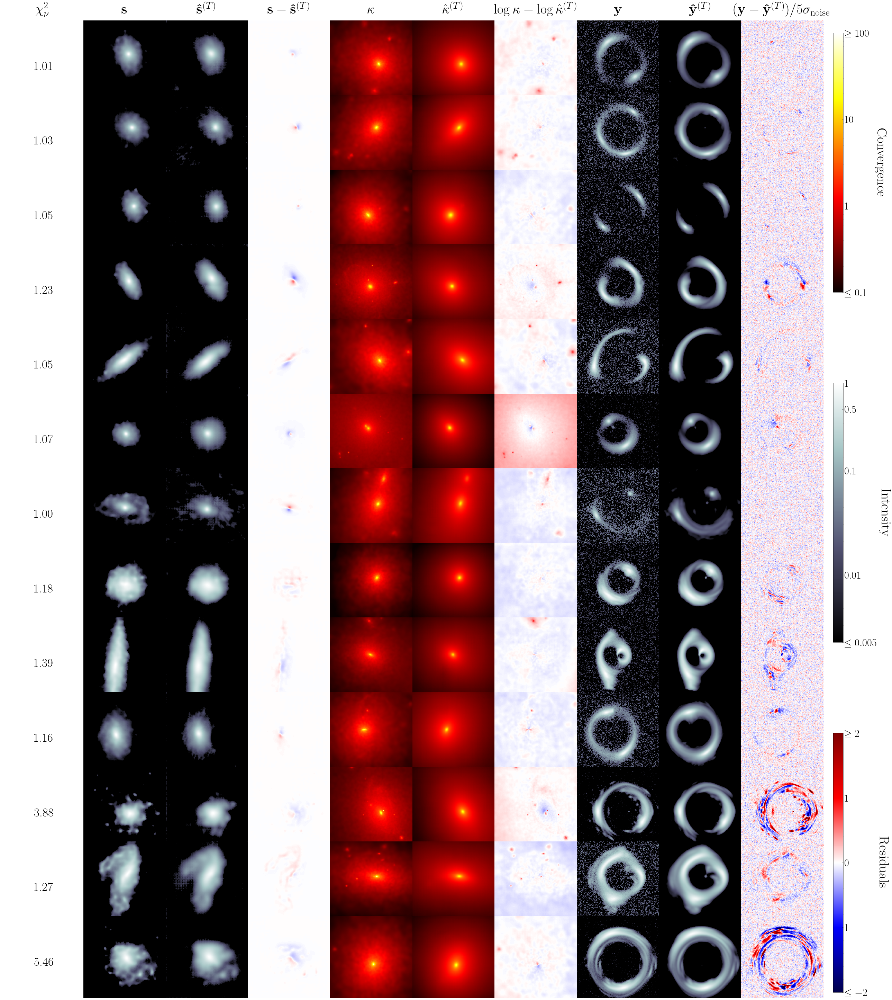

In [256]:
N = 13 # Full page + description
# For RIMSource A0 set
# start = 0 # representative sample 3
# start = 80 # represnetative sample 1
# start = 190  # representative sample 2
start = 100 # 80 is good, 100 is insane, 800 show case a very interesting key shaped lens, 1920 is also insane -> 5 blobs



fig, axs = plt.subplots(N, 10, figsize=(40, 4 * N))

for i in range(N):
    j = i + start
    b = j // B
    k = j % B
    lens = hf[b][dataset][f"lens"][k].squeeze()
    source = hf[b][dataset][f"source"][k].squeeze()
    kappa = hf[b][dataset][f"kappa"][k].squeeze()
#     lens_pred = hf[b][dataset][f"lens_pred"][k].squeeze()
    lens_pred = hf[b][dataset][f"lens_pred_reoptimized"][k].squeeze()
    source_pred = hf[b][dataset][f"source_pred_reoptimized"][k].squeeze()
#     kappa_pred = hf[b][dataset][f"kappa_pred"][k][-1].squeeze()
    kappa_pred = hf[b][dataset][f"kappa_pred_reoptimized"][k].squeeze()
    chi_squared = chisq_ro[j]
    noise_rms = hf[b][dataset]["noise_rms"][k]

#     axs[i, 1].imshow(source, cmap="bone", vmin=0, vmax=1, origin="lower")
    axs[i, 1].imshow(source, cmap="bone", norm=ImageNormalize(stretch=LogStretch(), vmin=5e-3, vmax=1), origin="lower")
#     axs[i, 2].imshow(source_pred, cmap="bone", vmin=0, vmax=1, origin="lower")
    axs[i, 2].imshow(source_pred, cmap="bone", norm=ImageNormalize(stretch=LogStretch(), vmin=5e-3, vmax=1), origin="lower")
    axs[i, 3].imshow(source - source_pred, cmap="seismic", vmin=-2, vmax=2, origin="lower")
    
    axs[i, 4].imshow(kappa, cmap="hot", norm=LogNorm(vmin=1e-1, vmax=100), origin="lower")
    axs[i, 5].imshow(kappa_pred, cmap="hot", norm=LogNorm(vmin=1e-1, vmax=100), origin="lower")
    axs[i, 6].imshow(np.log10(kappa) - np.log10(kappa_pred), cmap="seismic", vmin=-2, vmax=2, origin="lower")
    
#     axs[i, 7].imshow(lens, cmap="bone", vmin=0, vmax=1, origin="lower")
    axs[i, 7].imshow(lens, cmap="bone", norm=ImageNormalize(stretch=LogStretch(), vmin=5e-3, vmax=1), origin="lower")
#     axs[i, 8].imshow(lens_pred, cmap="bone", vmin=0, vmax=1, origin="lower")
    axs[i, 8].imshow(lens_pred, cmap="bone", norm=ImageNormalize(stretch=LogStretch(), vmin=5e-3, vmax=1), origin="lower")
    axs[i, 9].imshow((lens - lens_pred)/noise_rms/5, cmap="seismic", vmin=-2, vmax=2, origin="lower")
    
    axs[i, 0].annotate(f"{chi_squared:.2f}", xy=(0.4, 0.4), xycoords="axes fraction", size=35)

    
for i in range(N):            
    for j in range(10):
        axs[i, j].axis("off")

fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.67, 0.01, 0.2])
fig.colorbar(ScalarMappable(cmap="hot", norm=LogNorm(vmin=1e-1, vmax=100)), cax=cbar_ax, ticks=[0.1, 1, 10, 100])
cbar_ax.set_yticklabels(["$\leq 0.1$", "1", "10", "$\geq 100$"], fontsize=30) 
cbar_ax.set_ylabel(r"Convergence", rotation=270, labelpad=50, fontsize=40)
cbar_ax.yaxis.set_label_position("right")


fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.33 + .07, 0.01, 0.2])
fig.colorbar(ScalarMappable(cmap="bone", norm=ImageNormalize(stretch=LogStretch(), vmin=5e-3, vmax=1)), cax=cbar_ax, ticks=[0.005, 0.01, 0.1, 0.5, 1.])
cbar_ax.set_yticklabels(["$\leq 0.005$", "0.01", "0.1", "0.5", "1"], fontsize=30) 
cbar_ax.set_ylabel(r"Intensity", rotation=270, labelpad=40, fontsize=40)
cbar_ax.yaxis.set_label_position("right")

fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.13, 0.01, 0.2])
fig.colorbar(ScalarMappable(cmap="seismic", norm=Normalize(vmin=-2, vmax=2)), cax=cbar_ax, ticks=[-2, -1, 0, 1, 2])
cbar_ax.set_yticklabels(["$\leq -2$", "1", "0", "1", "$\geq 2$"], fontsize=30) 
cbar_ax.set_ylabel(r"Residuals", rotation=270, labelpad=60, fontsize=40)
cbar_ax.yaxis.set_label_position("right")

# axs[0, 0].set_title("Source")
# axs[0, 1].set_title("Source prédite")
# axs[0, 2].set_title("Différence")
# axs[0, 3].set_title("$\kappa$")
# axs[0, 4].set_title("$\hat{\kappa}_T$")
# axs[0, 5].set_title("$\kappa - \hat{\kappa}_T$")
# axs[0, 6].set_title("Observation ($\mathbf{y}$)")
# axs[0, 7].set_title("Prédiction ($\mathbf{\hat{y}}_T$)")
# axs[0, 8].set_title("$\mathbf{y} - \mathbf{\hat{y}}_T$")
# plt.subplots_adjust(wspace=0, hspace=0)
# plt.savefig(f"../results/rim_pred{start:d}.png")

# fig.suptitle("Validation set")
axs[0, 0].set_title(r"$\chi^2_\nu$", pad=20, fontsize=40)
axs[0, 1].set_title(r"$\mathbf{s}$", pad=20, fontsize=40)
axs[0, 2].set_title(r"$\mathbf{\hat{s}}^{(T)}$", pad=20, fontsize=40)
axs[0, 3].set_title(r"$\mathbf{s} - \mathbf{\hat{s}}^{(T)}$", pad=20, fontsize=40)
axs[0, 4].set_title("$\kappa$", pad=20, fontsize=40)
axs[0, 5].set_title("$\hat{\kappa}^{(T)}$", pad=20, fontsize=40)
axs[0, 6].set_title("$\log\kappa - \log\hat{\kappa}^{(T)}$", pad=20, fontsize=40)
axs[0, 7].set_title("$\mathbf{y}$", pad=20, fontsize=40)
axs[0, 8].set_title("$\mathbf{\hat{y}}^{(T)}$", pad=20, fontsize=40)
axs[0, 9].set_title("$(\mathbf{y} - \mathbf{\hat{y}}^{(T)})/5\sigma_{\mathrm{noise}}$", pad=20, fontsize=40)
plt.subplots_adjust(wspace=0, hspace=-0.1)
# plt.savefig("tests_rimsu128hstv4_representative_sample_reoptim2.png")
plt.savefig("tests_rimsu128hstv4_representative_sample_reoptim.png")

# plt.savefig("tests_rimsu128hstv4_representative_sample2.png")
# plt.savefig("tests_rimsu128hstv4_representative_sample3.png")

In [262]:
chisq
# indices = np.where(noise_rms > 0.03)[0]
# indices = np.where((chisq_ro > 3) & (noise_rms_list > 0.01))[0]
indices = np.where((chisq_ro < 1.0005))[0]


indices

array([   2,   31,   48,   67,   76,   79,   99,  116,  118,  193,  216,
        231,  236,  237,  275,  288,  300,  343,  351,  366,  369,  378,
        389,  391,  429,  432,  433,  446,  486,  489,  495,  550,  559,
        560,  575,  594,  605,  610,  622,  628,  635,  640,  643,  651,
        655,  693,  701,  728,  778,  780,  785,  790,  797,  803,  818,
        827,  828,  870,  883,  888,  906,  918,  923,  961,  992, 1000,
       1006, 1009, 1011, 1040, 1088, 1097, 1101, 1144, 1156, 1170, 1179,
       1194, 1213, 1223, 1238, 1256, 1261, 1272, 1293, 1327, 1329, 1330,
       1355, 1361, 1363, 1374, 1378, 1401, 1413, 1448, 1454, 1456, 1488,
       1507, 1519, 1585, 1608, 1641, 1674, 1697, 1714, 1716, 1717, 1724,
       1726, 1768, 1800, 1821, 1832, 1841, 1846, 1847, 1854, 1878, 1899,
       1905, 1907, 1912, 1929, 1950, 1952, 1984, 2059, 2130, 2206, 2248,
       2297, 2309, 2312, 2349, 2354, 2401, 2476, 2481, 2484, 2486, 2498,
       2507, 2527, 2530, 2532, 2533, 2567, 2596, 26

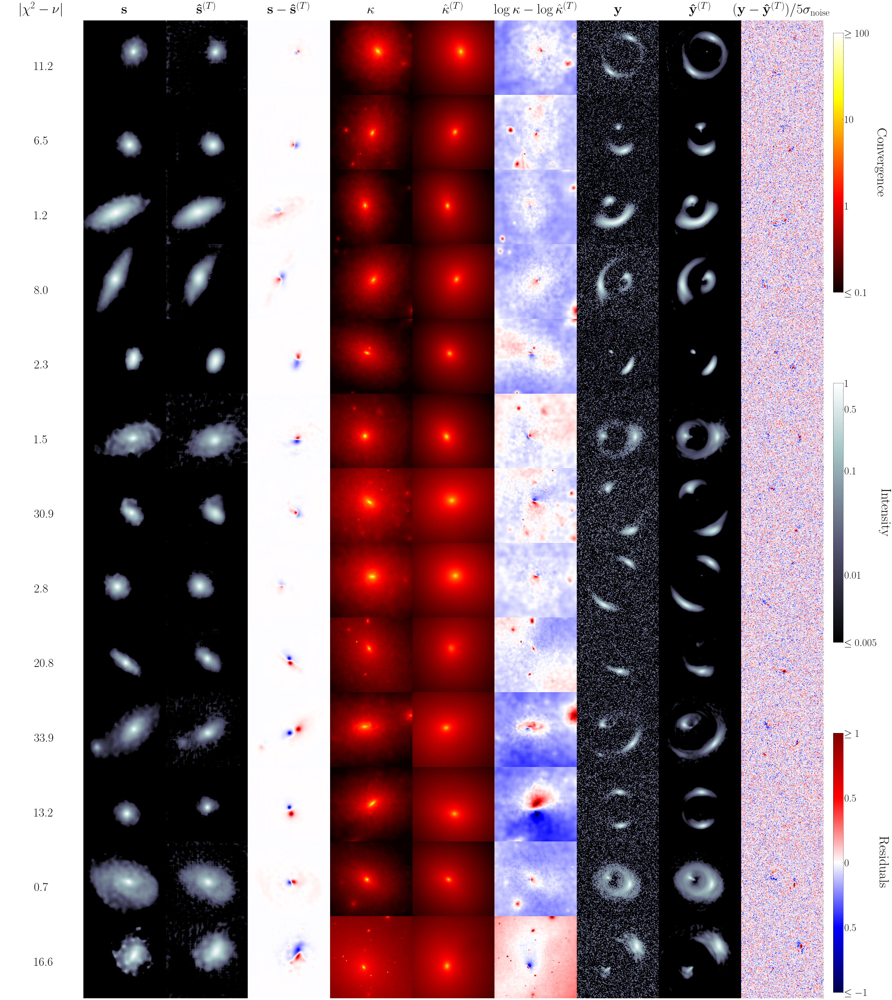

In [296]:
N = 13
fig, axs = plt.subplots(N, 10, figsize=(40, 4 * N))
start = 230

for i in range(N):
    j = indices[i + start]
    b = j // B
    k = j % B
    lens = hf[b][dataset][f"lens"][k].squeeze()
    source = hf[b][dataset][f"source"][k].squeeze()
    kappa = hf[b][dataset][f"kappa"][k].squeeze()
#     lens_pred = hf[b][dataset][f"lens_pred"][k].squeeze()
    lens_pred = hf[b][dataset][f"lens_pred_reoptimized"][k].squeeze()
    source_pred = hf[b][dataset][f"source_pred_reoptimized"][k].squeeze()
#     kappa_pred = hf[b][dataset][f"kappa_pred"][k][-1].squeeze()
    kappa_pred = hf[b][dataset][f"kappa_pred_reoptimized"][k].squeeze()
    chi_squared = chisq_ro[j]
    noise_rms = hf[b][dataset]["noise_rms"][k]

#     axs[i, 1].imshow(source, cmap="bone", vmin=0, vmax=1, origin="lower")
    axs[i, 1].imshow(source, cmap="bone", norm=ImageNormalize(stretch=LogStretch(), vmin=5e-3, vmax=1), origin="lower")
#     axs[i, 2].imshow(source_pred, cmap="bone", vmin=0, vmax=1, origin="lower")
    axs[i, 2].imshow(source_pred, cmap="bone", norm=ImageNormalize(stretch=LogStretch(), vmin=5e-3, vmax=1), origin="lower")
    axs[i, 3].imshow(source - source_pred, cmap="seismic", vmin=-1, vmax=1, origin="lower")
    
    axs[i, 4].imshow(kappa, cmap="hot", norm=LogNorm(vmin=1e-1, vmax=100), origin="lower")
    axs[i, 5].imshow(kappa_pred, cmap="hot", norm=LogNorm(vmin=1e-1, vmax=100), origin="lower")
    axs[i, 6].imshow(np.log10(kappa) - np.log10(kappa_pred), cmap="seismic", vmin=-1, vmax=1, origin="lower")
    
#     axs[i, 7].imshow(lens, cmap="bone", vmin=0, vmax=1, origin="lower")
    axs[i, 7].imshow(lens, cmap="bone", norm=ImageNormalize(stretch=LogStretch(), vmin=5e-3, vmax=1), origin="lower")
#     axs[i, 8].imshow(lens_pred, cmap="bone", vmin=0, vmax=1, origin="lower")
    axs[i, 8].imshow(lens_pred, cmap="bone", norm=ImageNormalize(stretch=LogStretch(), vmin=5e-3, vmax=1), origin="lower")
    axs[i, 9].imshow((lens - lens_pred)/noise_rms/5, cmap="seismic", vmin=-1, vmax=1, origin="lower")
    
    
    axs[i, 0].annotate(fr"{abs(chi_squared*128**2 - 128**2):.1f}", xy=(0.4, 0.4), xycoords="axes fraction", size=35)
#     axs[i, 0].annotate(fr"$\chi^2_\nu = ${chi_squared:.1f}", xy=(0.2, 0.4), xycoords="axes fraction", size=35)


    
for i in range(N):            
    for j in range(10):
        axs[i, j].axis("off")

fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.67, 0.01, 0.2])
fig.colorbar(ScalarMappable(cmap="hot", norm=LogNorm(vmin=1e-1, vmax=100)), cax=cbar_ax, ticks=[0.1, 1, 10, 100])
cbar_ax.set_yticklabels(["$\leq 0.1$", "1", "10", "$\geq 100$"], fontsize=30) 
cbar_ax.set_ylabel(r"Convergence", rotation=270, labelpad=50, fontsize=40)
cbar_ax.yaxis.set_label_position("right")


fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.33 + .07, 0.01, 0.2])
fig.colorbar(ScalarMappable(cmap="bone", norm=ImageNormalize(stretch=LogStretch(), vmin=5e-3, vmax=1)), cax=cbar_ax, ticks=[0.005, 0.01, 0.1, 0.5, 1.])
cbar_ax.set_yticklabels(["$\leq 0.005$", "0.01", "0.1", "0.5", "1"], fontsize=30) 
cbar_ax.set_ylabel(r"Intensity", rotation=270, labelpad=40, fontsize=40)
cbar_ax.yaxis.set_label_position("right")

fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.13, 0.01, 0.2])
fig.colorbar(ScalarMappable(cmap="seismic", norm=Normalize(vmin=-2, vmax=2)), cax=cbar_ax, ticks=[-2, -1, 0, 1, 2])
cbar_ax.set_yticklabels(["$\leq -1$", "0.5", "0", "0.5", "$\geq 1$"], fontsize=30) 
cbar_ax.set_ylabel(r"Residuals", rotation=270, labelpad=60, fontsize=40)
cbar_ax.yaxis.set_label_position("right")


axs[0, 0].set_title(r"$|\chi^2-\nu|$", pad=20, fontsize=40)
axs[0, 1].set_title(r"$\mathbf{s}$", pad=20, fontsize=40)
axs[0, 2].set_title(r"$\mathbf{\hat{s}}^{(T)}$", pad=20, fontsize=40)
axs[0, 3].set_title(r"$\mathbf{s} - \mathbf{\hat{s}}^{(T)}$", pad=20, fontsize=40)
axs[0, 4].set_title("$\kappa$", pad=20, fontsize=40)
axs[0, 5].set_title("$\hat{\kappa}^{(T)}$", pad=20, fontsize=40)
axs[0, 6].set_title("$\log\kappa - \log\hat{\kappa}^{(T)}$", pad=20, fontsize=40)
axs[0, 7].set_title("$\mathbf{y}$", pad=20, fontsize=40)
axs[0, 8].set_title("$\mathbf{\hat{y}}^{(T)}$", pad=20, fontsize=40)
axs[0, 9].set_title("$(\mathbf{y} - \mathbf{\hat{y}}^{(T)})/5\sigma_{\mathrm{noise}}$", pad=20, fontsize=40)
plt.subplots_adjust(wspace=0, hspace=-0.1)
plt.savefig("testset_bestcase5.png")

100%|██████████| 8/8 [00:20<00:00,  2.60s/it]


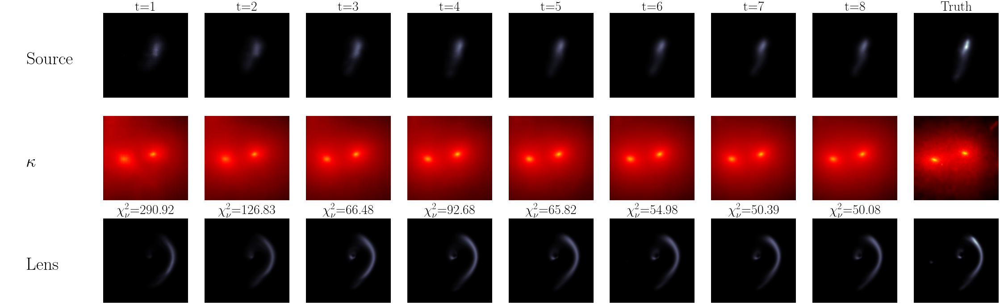

In [18]:
# k = 120 # interesting, but only a single kappa blob
# k = 125 # bad fit, might be interesting
k = 501 # two kappa blob, very interesting

fig, axs = plt.subplots(3, 10, figsize=(40, 12))
lens = hf[dataset][f"lens"][k].squeeze()
source = hf[dataset][f"source"][k].squeeze()
kappa = hf[dataset][f"kappa"][k].squeeze()
lens_pred = hf[dataset][f"lens_pred"][k].squeeze()
source_pred = hf[dataset][f"source_pred"][k][-1].squeeze()
kappa_pred = hf[dataset][f"kappa_pred"][k][-1].squeeze()
chi_squared = hf[dataset]["chi_squared"][k][-1] * 2
psf = hf["dataset"]["k"].squeeze()
noise_rms = hf[dataset]["noise_rms"][k]

axs[0, 0].annotate("Source", xy=(0.3, 0.4), xycoords="axes fraction", fontsize=40)
axs[0, 0].axis("off")
axs[1, 0].annotate(r"$\kappa$", xy=(0.3, 0.4), xycoords="axes fraction", fontsize=40)
axs[1, 0].axis("off")
axs[2, 0].annotate("Lens", xy=(0.3, 0.4), xycoords="axes fraction", fontsize=40)
axs[2, 0].axis("off")
for i in tqdm(range(1, 9)):
    lens = phys.forward(source_pred[i-1][None, ..., None], kappa_pred[i-1][None, ..., None], psf[None, ..., None])[0, ..., 0]
    axs[0, i].imshow(source_pred[i-1], cmap="bone", vmin=0, vmax=1, origin="lower")
    axs[0, i].axis("off")
    axs[0, i].set_title(f"t={i}")
    axs[1, i].imshow(kappa_pred[i-1], cmap="hot", norm=LogNorm(vmin=1e-1, vmax=100), origin="lower")
    axs[1, i].axis("off")
    axs[2, i].set_title(fr"$\chi^2_\nu$={chi_squared[i-1]:.2f}", pad=10)
    axs[2, i].imshow(lens, cmap="bone", vmin=0, vmax=1, origin="lower")
    axs[2, i].axis("off")
    
# fig.suptitle("Validation set")
axs[0, -1].imshow(source, cmap="bone", vmin=0, vmax=1, origin="lower")
axs[0, -1].axis("off")
axs[0, -1].set_title(f"Truth")
axs[1, -1].imshow(kappa, cmap="hot", norm=LogNorm(vmin=1e-1, vmax=100), origin="lower")
axs[1, -1].axis("off")
axs[2, -1].imshow(true_lens, cmap="bone", vmin=0, vmax=1, origin="lower")
axs[2, -1].axis("off")
# plt.savefig(f"RIMSU128hstv4_optim_example_{k}.png")

In [85]:
((source_pred - source)**2).mean(axis=(1, 2))

array([0.00070318, 0.00065931, 0.00073074, 0.00081619, 0.00088637,
       0.00094533, 0.00098925, 0.00102202], dtype=float32)

In [86]:
((kappa_pred - kappa)**2).mean(axis=(1, 2))

array([0.12869336, 0.12094872, 0.12233438, 0.12467327, 0.12583284,
       0.1268778 , 0.12755385, 0.12803097], dtype=float32)

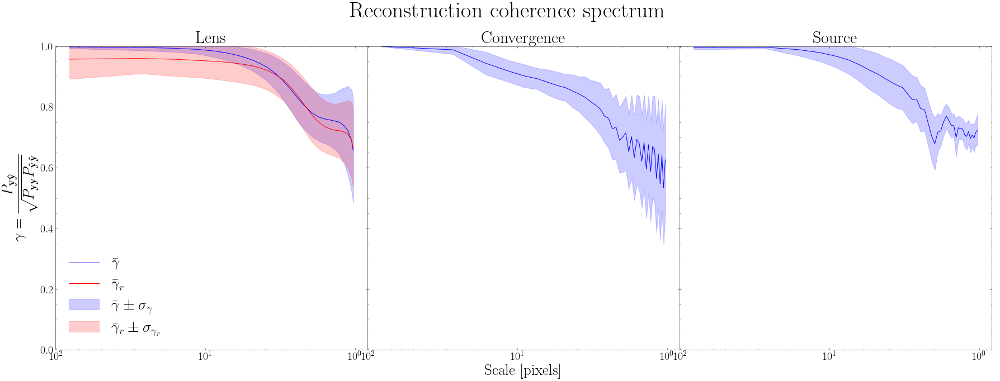

In [319]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10), sharey=True)
color = "b"
color2 = "r"

# lens
r_re = []
r = []
for i in range(len(hf)):
    r_re.append(hf[i][dataset]["lens_coherence_spectrum2"])
    r.append(hf[i][dataset]["lens_coherence_spectrum"])
r_re = np.concatenate(r_re, axis=0)
r = np.concatenate(r, axis=0)
f = np.array(hf[0][dataset]["lens_frequencies"])
bins=r.shape[1]

r_mean = r.mean(axis=0)
r_std = r.std(axis=0)
rr_mean = r_re.mean(axis=0)
rr_std = r_re.std(axis=0)
lam = 1/f/2


ax1.plot(lam, r_mean, "-", color=color, label=r"$\bar{\gamma}$")
ax1.fill_between(lam, r_mean - r_std, r_mean + r_std, color=color, alpha=0.2, label=r"$\bar{\gamma} \pm \sigma_\gamma$")
# ax1.fill_between(lam, r_mean - 2 * r_std, r_mean + 2 * r_std, color=color, alpha=0.1, label=r"$\bar{\gamma} \pm 2\sigma_\gamma$")
ax1.plot(lam, rr_mean, "-", color=color2, label=r"$\bar{\gamma}_{r}$")
ax1.fill_between(lam, rr_mean - rr_std, rr_mean + rr_std, color=color2, alpha=0.2, label=r"$\bar{\gamma}_r \pm \sigma_{\gamma_r}$")
# ax1.fill_between(lam, rr_mean - 2 * rr_std, r_mean + 2 * r_std, color=color2, alpha=0.1, label=r"$\bar{\gamma} \pm 2\sigma_{\gamma_r}$")

ax1.invert_xaxis()
ax1.set_xscale("log")
ax1.set_ylim(0, 1)
ax1.set_ylabel(r"$\gamma = \dfrac{P_{\mathbf{y}\mathbf{\hat{y}}}}{\sqrt{P_{\mathbf{y}\mathbf{y}} P_{\mathbf{\hat{y}}\mathbf{\hat{y}}}}}$")
ax1.set_title("Lens")
ax1.legend()

# kappa
r_re = []
r = []
for i in range(len(hf)):
    r_re.append(hf[i][dataset]["kappa_coherence_spectrum_reoptimized"])
    r.append(hf[i][dataset]["kappa_coherence_spectrum"])
r_re = np.concatenate(r_re, axis=0)
r = np.concatenate(r, axis=0)
bins=r.shape[1]

r_mean = r.mean(axis=0)
r_std = r.std(axis=0)
rr_mean = r_re.mean(axis=0)
rr_std = r_re.std(axis=0)
lam = 1/f/2



ax2.plot(lam, r_mean, "-", color=color, label=r"$\bar{\gamma}$")
ax2.fill_between(lam, r_mean - r_std, r_mean + r_std, color=color, alpha=0.2, label=r"$\bar{\gamma} \pm \sigma_\gamma$")
# ax2.fill_between(lam, r_mean - 2 * r_std, r_mean + 2 * r_std, color=color, alpha=0.1, label=r"$\bar{\gamma} \pm 2\sigma_\gamma$")
ax2.plot(lam, rr_mean, "-", color=color2, label=r"$\bar{\gamma}_{r}$")
ax2.fill_between(lam, rr_mean - rr_std, rr_mean + rr_std, color=color2, alpha=0.2, label=r"$\bar{\gamma}_r \pm \sigma_{\gamma_r}$")
# ax2.fill_between(lam, rr_mean - 2 * rr_std, r_mean + 2 * r_std, color=color2, alpha=0.1, label=r"$\bar{\gamma} \pm 2\sigma_{\gamma_r}$")
ax2.invert_xaxis()
ax2.set_xscale("log")
ax2.set_ylim(0, 1)
ax2.set_title("Convergence")
# plt.xlim(128, 3)
# ax2.legend(loc="lower left")


# source
r_re = []
r = []
for i in range(len(hf)):
    r_re.append(hf[i][dataset]["source_coherence_spectrum_reoptimized"])
    r.append(hf[i][dataset]["source_coherence_spectrum"])
r_re = np.concatenate(r_re, axis=0)
r = np.concatenate(r, axis=0)
bins=r.shape[1]

r_mean = r.mean(axis=0)
r_std = r.std(axis=0)
rr_mean = r_re.mean(axis=0)
rr_std = r_re.std(axis=0)
lam = 1/f/2

ax3.plot(lam, r_mean, "-", color=color, label=r"$\bar{\gamma}$")
ax3.fill_between(lam, r_mean - r_std, r_mean + r_std, color=color, alpha=0.2, label=r"$\bar{\gamma} \pm \sigma_\gamma$")
# ax3.fill_between(lam, r_mean - 2 * r_std, r_mean + 2 * r_std, color=color, alpha=0.1, label=r"$\bar{\gamma} \pm 2\sigma_\gamma$")
ax3.plot(lam, rr_mean, "-", color=color2, label=r"$\bar{\gamma}_{r}$")
ax3.fill_between(lam, rr_mean - rr_std, rr_mean + rr_std, color=color2, alpha=0.2, label=r"$\bar{\gamma}_r \pm \sigma_{\gamma_r}$")
# ax3.fill_between(lam, rr_mean - 2 * rr_std, r_mean + 2 * r_std, color=color2, alpha=0.1, label=r"$\bar{\gamma} \pm 2\sigma_{\gamma_r}$")
ax3.invert_xaxis()
ax3.set_xscale("log")
ax3.set_ylim(0, 1)
ax3.set_title("Source")
# plt.xlim(128, 3)
# ax3.legend(loc="lower left")

fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel(r"Scale [pixels]")

plt.subplots_adjust(wspace=0, hspace=0);
fig.suptitle("Reconstruction coherence spectrum", y=0.99);
plt.savefig("coherence_spectrum.png")

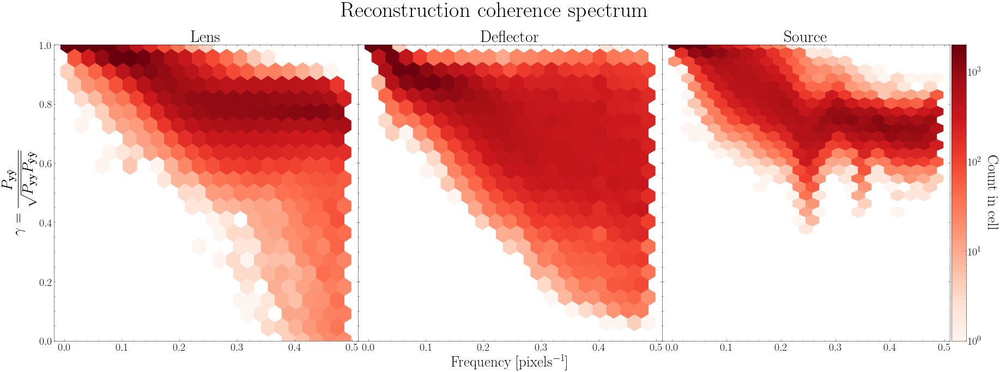

In [173]:

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10), sharey=True)
gridsize=20

# lens
r = np.array(hf[dataset]["lens_coherence_spectrum"])
f = np.array(hf[dataset]["lens_frequencies"])
point_cloud = np.stack([np.tile(f, r.shape[0]), r.ravel()], axis=1)
ax1.hexbin(point_cloud[:, 0], point_cloud[:, 1], gridsize=gridsize, cmap='Reds', norm=LogNorm(vmin=1, vmax=2000), mincnt=1)
ax1.set_ylim(0, 1)
# ax1.set_xlim(0, 0.5)
ax1.set_ylabel(r"$\gamma = \dfrac{P_{\mathbf{y}\mathbf{\hat{y}}}}{\sqrt{P_{\mathbf{y}\mathbf{y}} P_{\mathbf{\hat{y}}\mathbf{\hat{y}}}}}$")
ax1.set_title("Lens")


# # kappa
r = np.array(hf[dataset]["kappa_coherence_spectrum"])
f = np.array(hf[dataset]["kappa_frequencies"])
point_cloud = np.stack([np.tile(f, r.shape[0]), r.ravel()], axis=1)
ax2.hexbin(point_cloud[:, 0], point_cloud[:, 1], gridsize=gridsize, cmap='Reds', norm=LogNorm(vmin=1, vmax=2000), mincnt=1)
ax2.set_ylim(0, 1)
# ax2.set_xlim(0, 0.5)
ax2.set_title("Deflector")


# source
r = np.array(hf[dataset]["source_coherence_spectrum"])
f = np.array(hf[dataset]["source_frequencies"])
point_cloud = np.stack([np.tile(f, r.shape[0]), r.ravel()], axis=1)
ax3.hexbin(point_cloud[:, 0], point_cloud[:, 1], gridsize=gridsize, cmap='Reds', norm=LogNorm(vmin=1, vmax=2000), mincnt=1)
ax3.set_ylim(0, 1)
# ax3.set_xlim(0, 0.5)
ax3.set_title("Source")

divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(ScalarMappable(cmap="Reds", norm=LogNorm(vmin=1, vmax=2000)), cax=cax)
cax.set_ylabel("Count in cell", rotation=270, labelpad=30)


fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel(r"Frequency [pixels$^{-1}$]")

plt.subplots_adjust(wspace=0, hspace=0);
fig.suptitle("Reconstruction coherence spectrum", y=0.99);
plt.savefig("RIMSU128hstv4_coherence_spectrum.png")